In [1]:
pip install yfinance --upgrade --no-cache-dir

  Found existing installation: yfinance 0.1.70
    Uninstalling yfinance-0.1.70:
      Successfully uninstalled yfinance-0.1.70
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install pandas --upgrade --no-cache-dir

Requirement already up-to-date: pandas in d:\programmas\anaconda\lib\site-packages (1.3.5)
Note: you may need to restart the kernel to use updated packages.


In [1]:
import yfinance as yf
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
import pandas as pd
import datetime as dt
from pandas_datareader import data as pdr

from scipy.integrate import quad
from scipy.optimize import minimize
from datetime import datetime

D:\Programmas\Anaconda\lib\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)


In [6]:
duration_days = 5000
end = dt.datetime.now()
start = end - dt.timedelta(days=duration_days)
start, end

(datetime.datetime(2009, 1, 10, 14, 0, 0, 679821),
 datetime.datetime(2022, 9, 19, 14, 0, 0, 679821))

In [34]:
stockList = ['AAPL', 'TSLA', 'GOOGL', '^GSPC']

In [35]:
# df = pdr.DataReader(stockList,'yahoo', start, end)
df = pdr.get_data_yahoo(stockList, start, end) #build dataframe df
df.head()

Attributes Adj Close                                Close                 \
Symbols         AAPL TSLA     GOOGL       ^GSPC      AAPL TSLA     GOOGL   
Date                                                                       
2009-01-12  2.703598  NaN  7.825075  870.260010  3.166429  NaN  7.825075   
2009-01-13  2.674628  NaN  7.865866  871.789978  3.132500  NaN  7.865866   
2009-01-14  2.602052  NaN  7.531782  842.619995  3.047500  NaN  7.531782   
2009-01-15  2.542589  NaN  7.482232  843.739990  2.977857  NaN  7.482232   
2009-01-16  2.510571  NaN  7.499249  850.119995  2.940357  NaN  7.499249   

Attributes                  High       ...       Low                  Open  \
Symbols          ^GSPC      AAPL TSLA  ...     GOOGL       ^GSPC      AAPL   
Date                                   ...                                   
2009-01-12  870.260010  3.249643  NaN  ...  7.763514  864.320007  3.230714   
2009-01-13  871.789978  3.205000  NaN  ...  7.767518  862.020020  3.151429   
2009-01-14  842.619995  3.116071  NaN  ...  7.451201  836.929993  3.080000   
2009-01-15  843.739990  3.004286  NaN  ...  7.176927  817.039978  2.877500   
2009-01-16  850.119995  3.013571  NaN  ...  7.399900  830.659973  3.010714   

Attributes                                   Volume                    \
Symbols    TSLA     GOOGL       ^GSPC          AAPL TSLA        GOOGL   
Date                                                                    
2009-01-12  NaN  7.915666  890.400024  6.177164e+08  NaN  132039828.0   
2009-01-13  NaN  7.802052  869.789978  7.983976e+08  NaN  177122700.0   
2009-01-14  NaN  7.757758  867.280029  1.021664e+09  NaN  218497284.0   
2009-01-15  NaN  7.446697  841.989990  1.831634e+09  NaN  237142620.0   
2009-01-16  NaN  7.633133  844.450012  1.047626e+09  NaN  208767024.0   

Attributes                
Symbols            ^GSPC  
Date                      
2009-01-12  4.725050e+09  
2009-01-13  5.567460e+09  
2009-01-14  5.407880e+09  
2009-01-15  7.807350e+09  
2009-01-16  6.786040e+09  

[5 rows x 24 columns]

In [36]:
df.index

DatetimeIndex(['2009-01-12', '2009-01-13', '2009-01-14', '2009-01-15',
               '2009-01-16', '2009-01-20', '2009-01-21', '2009-01-22',
               '2009-01-23', '2009-01-26',
               ...
               '2022-09-02', '2022-09-06', '2022-09-07', '2022-09-08',
               '2022-09-09', '2022-09-12', '2022-09-13', '2022-09-14',
               '2022-09-15', '2022-09-16'],
              dtype='datetime64[ns]', name='Date', length=3445, freq=None)

In [37]:
df.columns

MultiIndex([('Adj Close',  'AAPL'),
            ('Adj Close',  'TSLA'),
            ('Adj Close', 'GOOGL'),
            ('Adj Close', '^GSPC'),
            (    'Close',  'AAPL'),
            (    'Close',  'TSLA'),
            (    'Close', 'GOOGL'),
            (    'Close', '^GSPC'),
            (     'High',  'AAPL'),
            (     'High',  'TSLA'),
            (     'High', 'GOOGL'),
            (     'High', '^GSPC'),
            (      'Low',  'AAPL'),
            (      'Low',  'TSLA'),
            (      'Low', 'GOOGL'),
            (      'Low', '^GSPC'),
            (     'Open',  'AAPL'),
            (     'Open',  'TSLA'),
            (     'Open', 'GOOGL'),
            (     'Open', '^GSPC'),
            (   'Volume',  'AAPL'),
            (   'Volume',  'TSLA'),
            (   'Volume', 'GOOGL'),
            (   'Volume', '^GSPC')],
           names=['Attributes', 'Symbols'])

In [38]:
#Acces useflul attributes, e.g. acces "Close" price information
Close = df.Close
Close.head()

Symbols,AAPL,TSLA,GOOGL,^GSPC
Date,,,,
2009-01-12,3.166429,NaN,7.825075,870.260010
2009-01-13,3.132500,NaN,7.865866,871.789978
2009-01-14,3.047500,NaN,7.531782,842.619995
2009-01-15,2.977857,NaN,7.482232,843.739990
2009-01-16,2.940357,NaN,7.499249,850.119995


In [39]:
#Pandas describe feature: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html
Close[Close.index > end - dt.timedelta(days=100)].describe()
#count yields number of trading days

Symbols,AAPL,TSLA,GOOGL,^GSPC
count,67.000000,67.000000,67.000000,67.000000
mean,153.901492,268.574976,112.590119,3980.190616
std,12.258665,30.038553,4.868041,166.156946
min,130.059998,213.100006,102.800003,3666.770020
25%,145.180000,237.676666,108.951500,3838.234985
50%,154.529999,275.609985,112.241997,3959.899902
75%,164.244995,296.559998,116.474998,4125.600098
max,174.550003,309.320007,122.080002,4305.200195


In [41]:
Close.plot()

In [42]:
pip install plotly==5.10.0

Note: you may need to restart the kernel to use updated packages.


In [21]:
#jupyter labextension install jupyterlab-plotly

SyntaxError: invalid syntax (<ipython-input-21-923fc71b0f42>, line 1)

In [43]:
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

pd.options.plotting.backend = 'plotly'

In [44]:
Close.plot()

In [28]:
Close['GOOGL'].pct_change().plot(kind='hist')

In [56]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [68]:
#create new dataframe for one specific stock
stock = 'GOOGL'
start1 = dt.datetime(2015,1,1)

df1 = pdr.get_data_yahoo('GOOGL', start1, end)

In [69]:
#Create Moving Average terms (MA)
df1['MA50'] = df1['Close'].rolling(window=50, min_periods=0).mean() #window value show minimal number of data point to calculate mean (MA)
df1['MA200'] = df1['Close'].rolling(window=200, min_periods=0).mean() 
df1['MA50'].head()
df1['MA200'].head()

Date
2015-01-02    26.477501
2015-01-05    26.225250
2015-01-06    25.927500
2015-01-07    25.760000
2015-01-08    25.677100
Name: MA200, dtype: float64

In [74]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                   subplot_titles=('GOOGL', 'Volume'), row_width=[0.2,0.7])

In [75]:
fig.add_trace(go.Candlestick(x=df1.index, open=df1['Open'], high=df1['High'], low=df1['Low'], close=df1['Close'], name='OHLC'),
             row=1, col=1)

In [76]:
fig.add_trace(go.Scatter(x=df1.index,y=df1['MA50'], marker_color='grey', name='MA50'), row=1, col=1)
fig.add_trace(go.Scatter(x=df1.index,y=df1['MA200'], marker_color='lightgrey', name='MA200'), row=1, col=1)

In [78]:
fig.add_trace(go.Bar(x=df1.index,y=df1['Volume'], marker_color='red', showlegend=False), row=2, col=1)

In [79]:
fig.update_layout(title='GOOGLE Historical Price Chart', xaxis_tickfont_size=12,
                 yaxis=dict(title='Price ($/share)', titlefont_size=14, tickfont_size=12),
                 autosize=False, width=800, height=500,margin=dict(l=50,r=50,b=100,t=100,pad=5),
                 paper_bgcolor='LightSteelBlue')

In [80]:
#Remove slider and enable regular zooming function
fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

In [81]:
import pylab
import seaborn as sns
import scipy.stats as stats

D:\Programmas\Anaconda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [82]:
#Study simple returns
simple_returns = df1.Close.pct_change().dropna()
simple_returns

Date
2015-01-05   -0.019054
2015-01-06   -0.024679
2015-01-07   -0.002941
2015-01-08    0.003484
2015-01-09   -0.012211
                ...   
2022-09-12    0.001898
2022-09-13   -0.058993
2022-09-14    0.006518
2022-09-15   -0.019905
2022-09-16   -0.001069
Name: Close, Length: 1940, dtype: float64

In [83]:
df1.Close.plot()

In [85]:
print('First', df1.Close[0], 'Last', df1.Close[-1])

First 26.477500915527344 Last 102.80000305175781


In [87]:
simple_returns.mean()

0.0008515580520201923

In [88]:
df1.Close[0]*(1+simple_returns.mean())**len(simple_returns)

138.0498668288508

In [89]:
df1.Close[0]*np.prod([(1+Rt) for Rt in simple_returns])
#Note that this is equal to the last close price above: df1.Close[-1]

102.80000305175747

In [95]:
#Study log returns
log_returns = np.log(df1.Close/df1.Close.shift(1)).dropna()
log_returns

Date
2015-01-05   -0.019238
2015-01-06   -0.024989
2015-01-07   -0.002945
2015-01-08    0.003478
2015-01-09   -0.012286
                ...   
2022-09-12    0.001896
2022-09-13   -0.060805
2022-09-14    0.006497
2022-09-15   -0.020105
2022-09-16   -0.001069
Name: Close, Length: 1940, dtype: float64

In [96]:
log_returns.mean()

0.0006992216661825662

In [97]:
df1.Close[0]*np.exp(log_returns.mean()*len(log_returns))

102.80000305175788

In [98]:
log_returns.plot(kind='hist')

In [117]:
#Are the log returns normally distributed?
log_returns_sorted = log_returns.tolist()
log_returns_sorted.sort()
worst = log_returns_sorted[0]
best = log_returns_sorted[-1]

std_worst = (worst-log_returns.mean())/log_returns.std()
std_best = (best-log_returns.mean())/log_returns.std()

print('Standard Deviation worst %.2f best %.2f' %(std_worst, std_best))
print('Probability of worst %.12f and of best %.17f' %(stats.norm(0,1).pdf(std_worst), stats.norm(0,1).pdf(std_best)))
#Probabilities of seeing these type of log returns, assuming the log returns are normally distributed, are of the order 10^-12; 10^-17 

Standard Deviation worst -7.14 best 8.60
Probability of worst 0.000000000003 and of best 0.00000000000000003


Q-Q plot


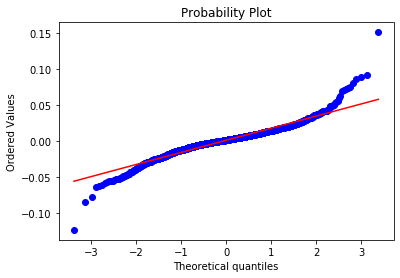

In [118]:
#Testing for normality
#Visually 
#Quantile-Quantile plots
stats.probplot(log_returns, dist='norm', plot=pylab)
print('Q-Q plot')
#We see very heavy "thick" tails

In [119]:
#Boxplots
log_returns.plot(kind="box")

In [121]:
#Numerically
#Kolmogorv Smirnov test
ks_statistic, p_value = stats.kstest(log_returns, 'norm')
print(ks_statistic, p_value)
if p_value > 0.05:
    print('Probably Gaussian')
else:
    print('Probably NOT Gaussian')

0.4737981532788368 0.0
Probably NOT Gaussian


In [122]:
#Shapiro Wilk test
sw_statistic, p_value = stats.shapiro(log_returns)
print(sw_statistic, p_value)
if p_value > 0.05:
    print('Probably Gaussian')
else:
    print('Probably NOT Gaussian')
    
#CONCLUSION: Financial Data (log returns) is NOT normally distributed over long time intervals

0.9278286695480347 1.3607278854610214e-29
Probably NOT Gaussian


In [123]:
#Continue with log returns of multiple stocks, i.e. df
log_returns = np.log(df.Close/df.Close.shift(1)).dropna()

In [124]:
daily_std = log_returns.std()

In [125]:
annualized_vol = daily_std*np.sqrt(252) #252 trading days in a year

In [130]:
fig = make_subplots(rows=2, cols=2)
trace0 = go.Histogram(x=log_returns['AAPL'], name='AAPL')
trace1 = go.Histogram(x=log_returns['TSLA'], name='TSLA')
trace2 = go.Histogram(x=log_returns['GOOGL'], name='GOOGL')
trace3 = go.Histogram(x=log_returns['^GSPC'], name='S&P500')

fig.append_trace(trace0, 1,1)
fig.append_trace(trace1, 1,2)
fig.append_trace(trace2, 2,1)
fig.append_trace(trace3, 2,2)

fig.update_layout(title='Frequency of log return', 
                 xaxis=dict(title='Apple Annualized Vol: '+str(np.round(annualized_vol['AAPL']*100,1))),
                 xaxis2=dict(title='Tesla Annualized Vol: '+str(np.round(annualized_vol['TSLA']*100,1))),
                 xaxis3=dict(title='Google Annualized Vol: '+str(np.round(annualized_vol['GOOGL']*100,1))),
                 xaxis4=dict(title='S&P500 Annualized Vol: '+str(np.round(annualized_vol['^GSPC']*100,1))))

fig.show()

In [131]:
#Trailing volatility over time
TRADING_DAYS = 60
volatility = log_returns.rolling(window=TRADING_DAYS).std()*np.sqrt(TRADING_DAYS)

In [132]:
volatility.plot()

In [133]:
#Sharpe Ratio: measure for calculating risk-adjusted return
Rf = 0.01/252 #annualized risk-free interest rate
sharpe_ratio = (log_returns.rolling(window=TRADING_DAYS).mean()-Rf)*TRADING_DAYS/volatility

In [134]:
sharpe_ratio.plot()

In [135]:
#Sortino Ratio: similar to sharpe ratio, except only considers harmful variance
sortino_vol = log_returns[log_returns<0].rolling(window=TRADING_DAYS, center=True, min_periods=10).std()*np.sqrt(TRADING_DAYS)
sortino_ratio = (log_returns.rolling(window=TRADING_DAYS).mean()-Rf)*TRADING_DAYS/sortino_vol

In [136]:
sortino_vol.plot()

In [137]:
sortino_ratio.plot()

In [140]:
#M2 ratio: measures returns of portfolio, adjusted for the risk of portfolio relative to the risk of some benchmark
m2_ratio = pd.DataFrame()
benchmark_vol = volatility['^GSPC']
for i in log_returns.columns:
    if i != '^GSPC':
        m2_ratio[i]=(sharpe_ratio[i]*benchmark_vol/TRADING_DAYS +Rf)*TRADING_DAYS

In [141]:
m2_ratio.plot()

In [144]:
#Max Drawdown: steepest decline from peak to bottom for an investment
def max_drawdown(returns):
    cumulative_returns = (1+returns).cumprod()
    peak = cumulative_returns.expanding(min_periods=1).max()
    drawdown = (cumulative_returns/peak)-1
    return drawdown.min()

returns = df.Close.pct_change().dropna()
max_drawdowns = returns.apply(max_drawdown, axis=0)
max_drawdowns*100

Symbols
AAPL    -44.376870
TSLA    -60.626539
GOOGL   -31.392798
^GSPC   -33.924960
dtype: float64

In [145]:
#Calmar Ratio: uses max drawdown in the denominator as opposed to standard deviation
calmars = np.exp(log_returns.mean()*252)/abs(max_drawdowns)
calmars.plot.bar()